<a href="https://colab.research.google.com/github/vdtheone1/computer-vision/blob/master/Find_a_Car_Parking.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow import keras

# Helper libraries
import numpy as np
import matplotlib.pyplot as plt

print(tf.__version__)

2.2.0


# Create a data frame

In [ ]:
import os
import pandas as pd


Free_list=os.listdir("/content/drive/My Drive/Colab Notebooks/Agrobium project/Finding car parking/data/Free")
full_list=os.listdir("/content/drive/My Drive/Colab Notebooks/Agrobium project/Finding car parking/data/Full")
category_free=[]
category_full=[]
for i in Free_list:
  if i in ['img_1006171058.jpg','img_1006170558.jpg']:
    category_free.append('Full')
  else:
    category_free.append('Free')

for i in full_list:
  category_full.append('Full')
df_free=pd.DataFrame({'feature':Free_list,'category':category_free})
df_full=pd.DataFrame({'feature':full_list,'category':category_full})
df=pd.concat([df_free,df_full])

In [ ]:

df.head()

,feature,category
0,img_816143058.jpg,Free
1,img_815174602.jpg,Free
2,img_814133058.jpg,Free
3,img_815174101.jpg,Free
4,img_817075558.jpg,Free


In [ ]:
df[(df['feature']=='img_1006171058.jpg')|(df['feature']=='img_1006170558.jpg')] # category changed as the image data shows the parking is completly occuplied but seen in the free folder

,feature,category
1008,img_1006170558.jpg,Full
1011,img_1006171058.jpg,Full


# Shuffing the dataframe

In [ ]:
from sklearn.utils import shuffle
df = shuffle(df)
df=df.reset_index(drop=True)
df.head()

,feature,category
0,img_901150558.jpg,Free
1,img_730083006.jpg,Full
2,img_1216155558.jpg,Free
3,img_903230602.jpg,Full
4,img_1208161558.jpg,Full


In [ ]:
df['category'].value_counts() #count

Full    2247
Free    1065
Name: category, dtype: int64

#Train test split

In [ ]:
#train_path="/content/drive/My Drive/Colab Notebooks/Agrobium project/Finding car parking/data"
from sklearn.model_selection import train_test_split
train_df,validation_df = train_test_split(df,test_size=0.10,random_state=50)

In [ ]:
train_df=train_df.reset_index(drop=True)
validation_df=validation_df.reset_index(drop=True)


In [ ]:
print('shape of train',train_df.shape)

print('shape of validation',validation_df.shape)

shape of train (2980, 2)
shape of validation (332, 2)


In [ ]:
train_df['category'].value_counts()


Full    2027
Free     953
Name: category, dtype: int64

In [ ]:
train_count=train_df.shape[0]
validation_count=validation_df.shape[0]

# Visualizing images


full image

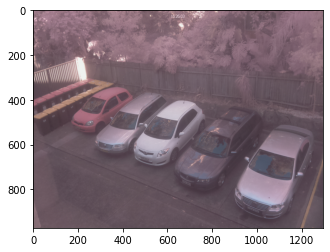

In [ ]:
from keras.preprocessing.image import ImageDataGenerator, load_img
from keras.utils import to_categorical

file_name=full_list[2]
image=load_img("/content/drive/My Drive/Colab Notebooks/Agrobium project/Finding car parking/data/Full/"+file_name)

plt.figure()
plt.imshow(image)
plt.grid(False)
plt.show()

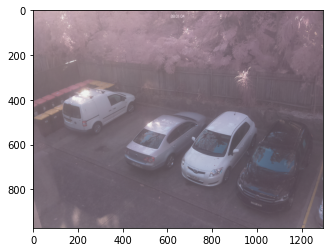

In [ ]:
file_name=Free_list[21]
image=load_img("/content/drive/My Drive/Colab Notebooks/Agrobium project/Finding car parking/data/Free/"+file_name)

plt.figure()
plt.imshow(image)
plt.grid(False)
plt.show()

In [ ]:
#import Pillow as PIL
from PIL import  Image
image = Image.open("/content/drive/My Drive/Colab Notebooks/Agrobium project/Finding car parking/data/all/"+file_name)


width, height = image.size
print(width,height)

1296 972


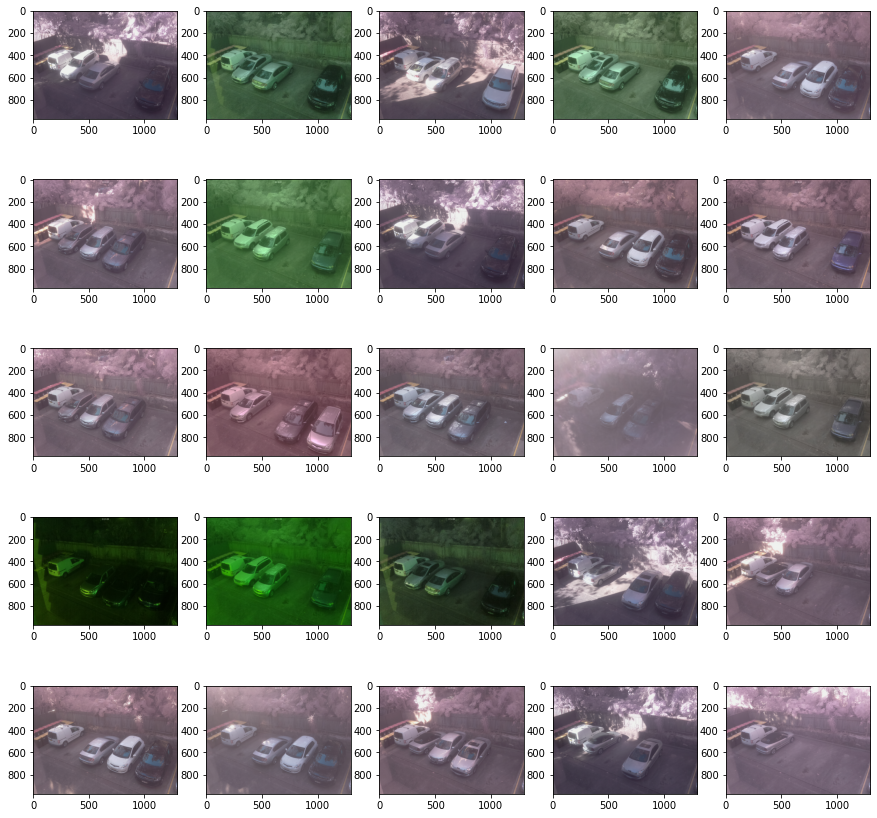

In [ ]:
plt.figure(figsize=(15,15))
for i in range(25):
  plt.subplot(5,5,i+1)
  file_name=Free_list[i]
  image=load_img("/content/drive/My Drive/Colab Notebooks/Agrobium project/Finding car parking/data/Free/"+file_name)
  plt.imshow(image)



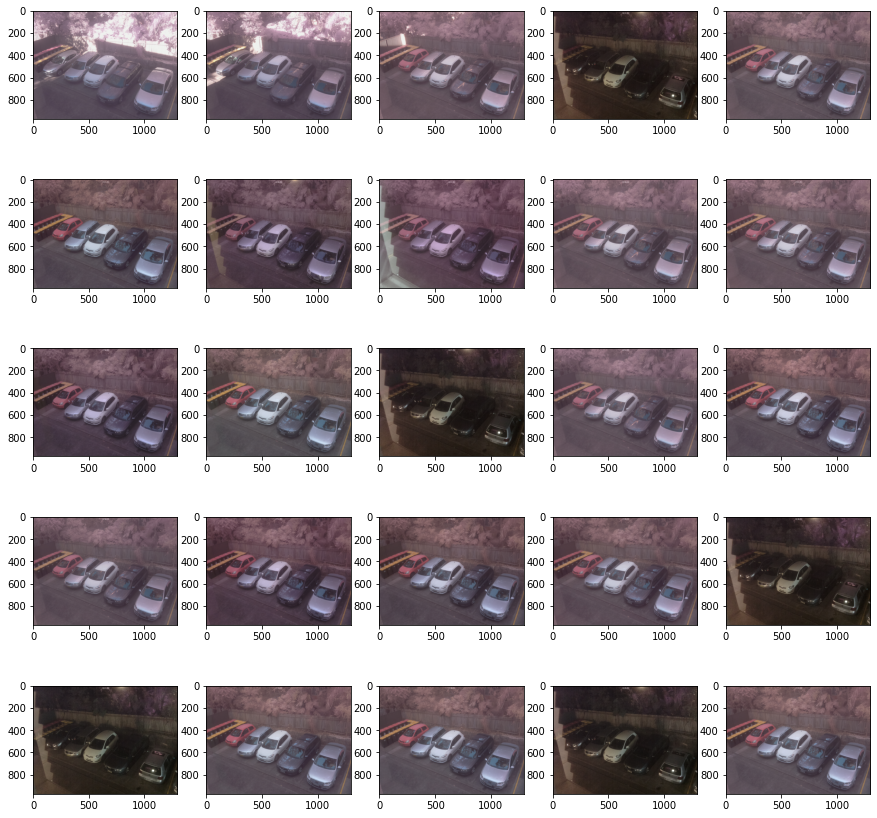

In [ ]:
plt.figure(figsize=(15,15))
for i in range(25):
  plt.subplot(5,5,i+1)
  file_name=full_list[i]
  image=load_img("/content/drive/My Drive/Colab Notebooks/Agrobium project/Finding car parking/data/Full/"+file_name)
  plt.imshow(image)

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(
        rotation_range=5,
        width_shift_range=0.1,
        height_shift_range=0.1,
        rescale=1./255,
        shear_range=0.1,
        zoom_range=0.1,
        horizontal_flip=True,
        fill_mode='nearest')
validation_datagen=ImageDataGenerator(rescale=1./255)

Using TensorFlow backend.


testing the image generator

In [ ]:
ex_data=train_df.sample(n=1).reset_index(drop=True)
ex_aug= train_datagen.flow_from_dataframe(ex_data, 
    "/content/drive/My Drive/Colab Notebooks/Agrobium project/Finding car parking/data/all/", 
    x_col='feature',
    y_col='category',
    target_size=(256, 256),
    class_mode='raw'
)

Found 1 validated image filenames.


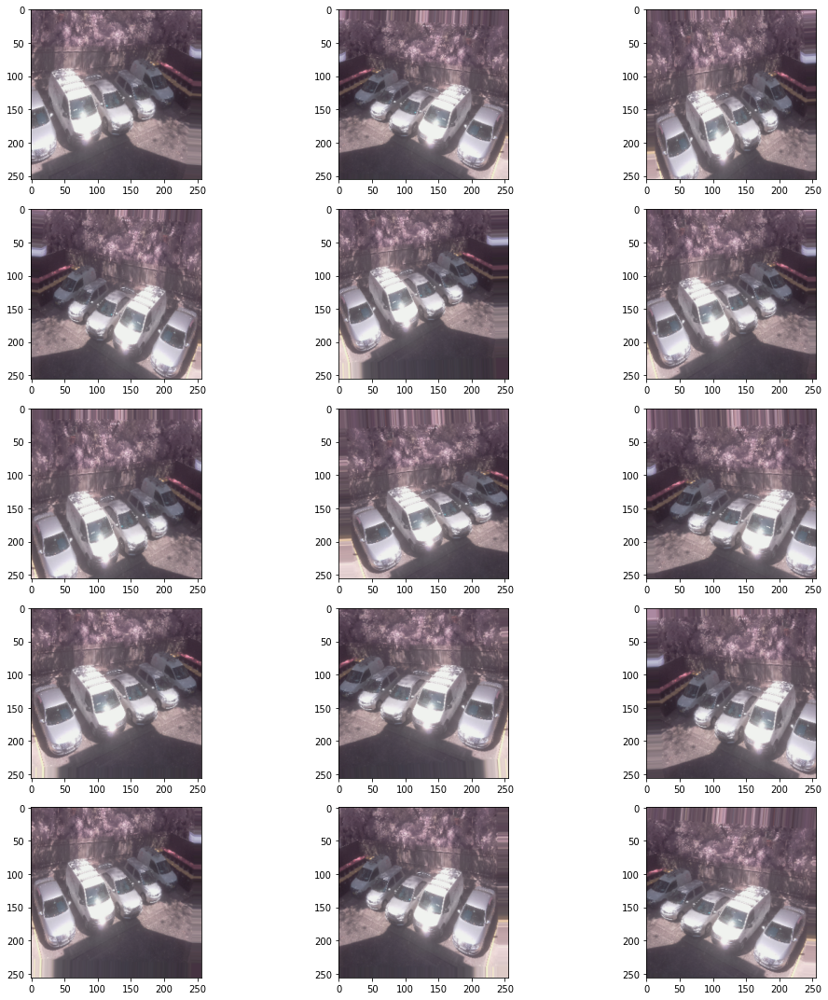

In [ ]:
plt.figure(figsize=(15, 15))
for i in range(0, 15):
    plt.subplot(5, 3, i+1)
    for X_batch, Y_batch in ex_aug:
        image = X_batch[0]
        plt.imshow(image)
        break
plt.tight_layout()
plt.show()

# Generating data augmentation for train and validation dataset

In [ ]:
train_data_generator=train_datagen.flow_from_dataframe(train_df, 
    "/content/drive/My Drive/Colab Notebooks/Agrobium project/Finding car parking/data/all/", 
    x_col='feature',
    y_col='category',
    #color_mode="grayscale",
    target_size=(128,128),
    class_mode='binary'
)
validation_data_generator=validation_datagen.flow_from_dataframe(validation_df, 
    "/content/drive/My Drive/Colab Notebooks/Agrobium project/Finding car parking/data/all/", 
    x_col='feature',
    y_col='category',
    #color_mode="grayscale",
    target_size=(128,128),
    class_mode='binary'
)

Found 2931 validated image filenames belonging to 2 classes.
Found 331 validated image filenames belonging to 2 classes.


/usr/local/lib/python3.6/dist-packages/keras_preprocessing/image/dataframe_iterator.py:282: UserWarning: Found 49 invalid image filename(s) in x_col="feature". These filename(s) will be ignored.
  .format(n_invalid, x_col)
/usr/local/lib/python3.6/dist-packages/keras_preprocessing/image/dataframe_iterator.py:282: UserWarning: Found 1 invalid image filename(s) in x_col="feature". These filename(s) will be ignored.
  .format(n_invalid, x_col)


In [ ]:
train_data_generator.classes()

TypeError: ignored

# Simple baseline model

In [ ]:
# Simple MLP

# Keras Sequential Model
tf.random.set_seed(100)

tf.keras.backend.clear_session()  # For easy reset of notebook state.


model = keras.Sequential([
    keras.layers.Flatten(input_shape=(128,128,3)),
    keras.layers.Dense(256, activation='relu'),
    keras.layers.Dense(1)
])

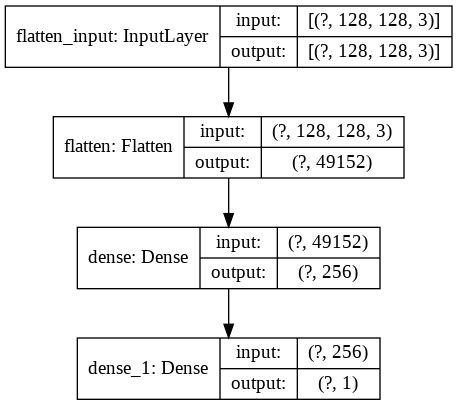

In [ ]:
from tensorflow.keras.utils import plot_model

plot_model(model, 'model.png', show_shapes=True)

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 49152)             0         
_________________________________________________________________
dense (Dense)                (None, 256)               12583168  
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 257       
Total params: 12,583,425
Trainable params: 12,583,425
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
earlystop = EarlyStopping(patience = 10)
learning_rate_reduction = ReduceLROnPlateau(monitor = 'val_acc',patience = 2,verbose = 1,factor = 0.5,min_lr = 0.00001)

callbacks = [earlystop,learning_rate_reduction]

In [ ]:
batch_size=20
trained_basic_model = model.fit(
    train_data_generator, 
    epochs=10,
    validation_data=validation_data_generator,
    
    
    
    
)

Epoch 1/10
92/92 [==============================] - 2418s 26s/step - loss: 2.8535 - accuracy: 0.6179 - val_loss: 0.8139 - val_accuracy: 0.6586
Epoch 2/10
92/92 [==============================] - 96s 1s/step - loss: 0.9005 - accuracy: 0.6704 - val_loss: 1.6571 - val_accuracy: 0.4381
Epoch 3/10
92/92 [==============================] - 96s 1s/step - loss: 1.0615 - accuracy: 0.6660 - val_loss: 0.8285 - val_accuracy: 0.7583
Epoch 4/10
92/92 [==============================] - 96s 1s/step - loss: 1.1611 - accuracy: 0.6636 - val_loss: 0.7896 - val_accuracy: 0.7462
Epoch 5/10
92/92 [==============================] - 96s 1s/step - loss: 0.7561 - accuracy: 0.7097 - val_loss: 0.8009 - val_accuracy: 0.7251
Epoch 6/10
92/92 [==============================] - 95s 1s/step - loss: 0.9964 - accuracy: 0.6749 - val_loss: 1.1846 - val_accuracy: 0.7039
Epoch 7/10
92/92 [==============================] - 95s 1s/step - loss: 0.7880 - accuracy: 0.7114 - val_loss: 0.4899 - val_accuracy: 0.7795
Epoch 8/10
92/92 

In [ ]:
from keras.models import load_model
model = load_model(top_model_weights_path)

NameError: ignored

In [ ]:
def make_prediction(image):
    #Rescale image
    img = image/255.

    #Convert to a 4D tensor
    image = np.expand_dims(img, axis=0)
    #print(image.shape)

    # make predictions on the preloaded model
    class_predicted = model.predict(image)
    inID = np.argmax(class_predicted[0])
    label = class_dictionary[inID]
    return label

logs/20200624-181513


# Using resnet


In [ ]:
base_model=tf.keras.applications.ResNet50(
    include_top=False, weights=None, input_tensor=None, input_shape=(128,128,3)
    )
x=base_model.output
x=tf.keras.layers.GlobalAveragePooling2D()(x)
x=tf.keras.layers.Dropout(0.5)(x)

x = tf.keras.layers.Dense(512, activation='relu')(x)
prediction=tf.keras.layers.Dense(1, activation='sigmoid')(x)
res_model=tf.keras.Model(inputs = base_model.input, outputs = prediction)
# https://github.com/priya-dwivedi/Deep-Learning/blob/master/resnet_keras/Residual_Network_Keras.ipynb

In [ ]:
res_model.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_24 (InputLayer)           [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 134, 134, 3)  0           input_24[0][0]                   
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 64, 64, 64)   9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 64, 64, 64)   256         conv1_conv[0][0]                 
____________________________________________________________________________________________

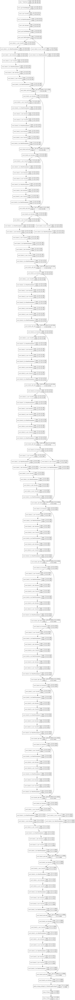

In [ ]:
from tensorflow.keras.utils import plot_model

plot_model(res_model, 'model.png', show_shapes=True)

In [ ]:
rms=tf.keras.optimizers.RMSprop()
res_model.compile(optimizer= rms, loss=tf.keras.losses.BinaryCrossentropy(from_logits=True), metrics=['accuracy'])

In [ ]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

res_model.fit(train_data_generator, validation_data=validation_data_generator, epochs=10)

Epoch 1/10
92/92 [==============================] - 174s 2s/step - loss: 0.6382 - accuracy: 0.6711 - val_loss: 0.6548 - val_accuracy: 0.6585
Epoch 2/10
92/92 [==============================] - 171s 2s/step - loss: 0.6381 - accuracy: 0.6752 - val_loss: 0.6548 - val_accuracy: 0.6585
Epoch 3/10
92/92 [==============================] - 171s 2s/step - loss: 0.6381 - accuracy: 0.6752 - val_loss: 0.6548 - val_accuracy: 0.6585
Epoch 4/10
92/92 [==============================] - 171s 2s/step - loss: 0.6381 - accuracy: 0.6752 - val_loss: 0.6548 - val_accuracy: 0.6585
Epoch 5/10
92/92 [==============================] - 171s 2s/step - loss: 0.6381 - accuracy: 0.6752 - val_loss: 0.6548 - val_accuracy: 0.6585
Epoch 6/10
92/92 [==============================] - 171s 2s/step - loss: 0.6381 - accuracy: 0.6752 - val_loss: 0.6548 - val_accuracy: 0.6585
Epoch 7/10
92/92 [==============================] - 173s 2s/step - loss: 0.6381 - accuracy: 0.6752 - val_loss: 0.6548 - val_accuracy: 0.6585
Epoch 8/10
92

# prediction


In [ ]:
predict_res=res_model.predict(validation_data_generator)
import sklearn
y_pred = np.argmax(predict_res, axis=1)
cm = sklearn.metrics.confusion_matrix(validation_data_generator.classes, y_pred)
print(cm)

[[111   0]
 [214   0]]


# res net using imagenet 


In [ ]:
base_model=tf.keras.applications.ResNet50(
    include_top=False, weights='imagenet', input_tensor=None, input_shape=(224, 224, 3),pooling='avg'
    )
x=base_model.output
#x=tf.keras.layers.GlobalAveragePooling2D()(x)
x=tf.keras.layers.Dropout(0.8)(x)
#x = tf.keras.layers.Dense(512, activation='relu',activity_regularizer=tf.keras.regularizers.l1(0.01))(x)
prediction=tf.keras.layers.Dense(1, activation='sigmoid')(x)
res_imagenet_model=tf.keras.Model(inputs = base_model.input, outputs = prediction)
# https://github.com/priya-dwivedi/Deep-Learning/blob/master/resnet_keras/Residual_Network_Keras.ipynb

In [ ]:
res_imagenet_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_6[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
____________________________________________________________________________________________

In [ ]:
rms=tf.keras.optimizers.RMSprop()
res_imagenet_model.compile(optimizer= rms, loss=tf.keras.losses.BinaryCrossentropy(), metrics=['accuracy'])

In [ ]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

res_imagenet_model.fit(train_data_generator, validation_data=validation_data_generator, epochs=10)

Epoch 1/10
47/47 [==============================] - 94s 2s/step - loss: 0.9720 - accuracy: 0.6041 - val_loss: 27103.3750 - val_accuracy: 0.5293
Epoch 2/10
47/47 [==============================] - 94s 2s/step - loss: 0.9320 - accuracy: 0.5901 - val_loss: 359157.9062 - val_accuracy: 0.4707
Epoch 3/10
47/47 [==============================] - 94s 2s/step - loss: 0.8421 - accuracy: 0.6409 - val_loss: 25196136.0000 - val_accuracy: 0.5293
Epoch 4/10
47/47 [==============================] - 94s 2s/step - loss: 0.8244 - accuracy: 0.6495 - val_loss: 0.6960 - val_accuracy: 0.4707
Epoch 5/10
47/47 [==============================] - 95s 2s/step - loss: 0.7429 - accuracy: 0.6696 - val_loss: 0.6975 - val_accuracy: 0.4707
Epoch 6/10
47/47 [==============================] - 94s 2s/step - loss: 0.8202 - accuracy: 0.6395 - val_loss: 6.1240 - val_accuracy: 0.5293
Epoch 7/10
47/47 [==============================] - 95s 2s/step - loss: 0.7296 - accuracy: 0.6782 - val_loss: 0.7004 - val_accuracy: 0.4707
Epoc

# resnet50 by freezing weights


In [ ]:
from keras.applications.resnet50 import ResNet50
base_model = ResNet50(include_top=False, weights=None, input_shape=(128,128,1))
x = Flatten()(base_model.output)
x = Dense(1, activation="sigmoid")(x)
model = Model(base_model.input, x)

for layer in base_model.layers[:-26]:
    layer.trainable = False


/usr/local/lib/python3.6/dist-packages/keras_applications/resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


In [ ]:

model.compile(loss='binary_crossentropy',
             optimizer='rmsprop',
             metrics=['accuracy'])

In [ ]:
tensorboard_callback = keras.callbacks.TensorBoard(logdir, histogram_freq=1)
history_res_freez=model.fit(train_data_generator, validation_data=validation_data_generator, epochs=10, callbacks=[tensorboard_callback])

Epoch 1/10
92/92 [==============================] - 126s 1s/step - loss: 0.7281 - accuracy: 0.7159 - val_loss: 3927.7214 - val_accuracy: 0.2975
Epoch 2/10
92/92 [==============================] - 120s 1s/step - loss: 0.7142 - accuracy: 0.7176 - val_loss: 504.5038 - val_accuracy: 0.7025
Epoch 3/10
92/92 [==============================] - 119s 1s/step - loss: 0.7179 - accuracy: 0.7047 - val_loss: 212.1550 - val_accuracy: 0.2975
Epoch 4/10
92/92 [==============================] - 118s 1s/step - loss: 0.6583 - accuracy: 0.7347 - val_loss: 528.8204 - val_accuracy: 0.2975
Epoch 5/10
92/92 [==============================] - 120s 1s/step - loss: 0.6216 - accuracy: 0.7224 - val_loss: 1189.6212 - val_accuracy: 0.2975
Epoch 6/10
92/92 [==============================] - 120s 1s/step - loss: 0.6497 - accuracy: 0.7313 - val_loss: 494.7665 - val_accuracy: 0.2975
Epoch 7/10
92/92 [==============================] - 120s 1s/step - loss: 0.6120 - accuracy: 0.7367 - val_loss: 55.8235 - val_accuracy: 0.714

In [ ]:
predict_res=model.predict(train_data_generator)
import sklearn
y_pred = np.argmax(predict_res, axis=1)
cm = sklearn.metrics.confusion_matrix(train_data_generator.classes, y_pred)
print(cm)

[[ 968    0]
 [1968    0]]


In [ ]:
pd.DataFrame(train_data_generator).count(0)


KeyboardInterrupt: ignored

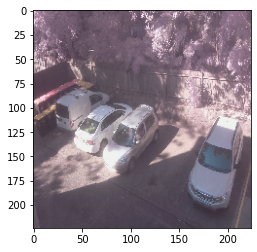

In [ ]:
from keras.preprocessing.image import ImageDataGenerator, load_img
from keras.utils import to_categorical
file_name=Free_list[2]
image1=load_img("/content/drive/My Drive/Colab Notebooks/Agrobium project/Finding car parking/data/Free/"+file_name,target_size=(224, 224))

plt.figure()
plt.imshow(image1)

ValueError: ignored

#Inceptive

In [ ]:
base_model=tf.keras.applications.InceptionV3(
    include_top=False, weights='imagenet', input_tensor=None, input_shape=(224, 224, 3)
    )
x=base_model.output
x=tf.keras.layers.GlobalAveragePooling2D()(x)

x = tf.keras.layers.Dense(1024, activation='relu')(x)
prediction=tf.keras.layers.Dense(1, activation='sigmoid')(x)
incep_imagenet_model=tf.keras.Model(inputs = base_model.input, outputs = prediction)

87916544/87910968 [==============================] - 1s 0us/step


In [ ]:
adam=tf.keras.optimizers.Adam()
incep_imagenet_model.compile(optimizer= adam, loss=tf.keras.losses.BinaryCrossentropy(from_logits=True), metrics=['accuracy'])

In [ ]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

incep_imagenet_model.fit(train_data_generator, validation_data=validation_data_generator, epochs=10, callbacks=[tensorboard_callback])

Epoch 1/10
47/47 [==============================] - 98s 2s/step - loss: 0.6950 - accuracy: 0.4973 - val_loss: 0.6931 - val_accuracy: 0.5293
Epoch 2/10
47/47 [==============================] - 92s 2s/step - loss: 0.6931 - accuracy: 0.5027 - val_loss: 0.6931 - val_accuracy: 0.5293
Epoch 3/10
47/47 [==============================] - 92s 2s/step - loss: 0.6931 - accuracy: 0.5027 - val_loss: 0.6931 - val_accuracy: 0.5293
Epoch 4/10
47/47 [==============================] - 91s 2s/step - loss: 0.6931 - accuracy: 0.5027 - val_loss: 0.6931 - val_accuracy: 0.5293
Epoch 5/10
47/47 [==============================] - 91s 2s/step - loss: 0.6931 - accuracy: 0.5027 - val_loss: 0.6931 - val_accuracy: 0.5293
Epoch 6/10
47/47 [==============================] - 91s 2s/step - loss: 0.6931 - accuracy: 0.5027 - val_loss: 0.6931 - val_accuracy: 0.5293
Epoch 7/10
47/47 [==============================] - 91s 2s/step - loss: 0.6931 - accuracy: 0.5027 - val_loss: 0.6931 - val_accuracy: 0.5293
Epoch 8/10
47/47 [==

# VGG16

In [ ]:
from keras.applications.vgg16 import VGG16
from keras.models import Model
from keras.layers import Conv2D,MaxPool2D,Dropout,Flatten,Dense,Activation,BatchNormalization

Using TensorFlow backend.


In [ ]:
vgg=VGG16(input_shape=(128, 128,3),weights='imagenet',include_top=False)
for layers in vgg.layers[:10]:
    layers.trainable=False
x=Flatten()(vgg.output)
output_layer=Dense(1,activation='sigmoid')(x)
model_transfer=Model(input=vgg.input,output=output_layer)
model_transfer.summary()


58892288/58889256 [==============================] - 5s 0us/step
Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 128, 128, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 128, 128, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 128, 128, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 64, 64, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 64, 64, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 64, 64, 128)       147584    
____________________________________________________________

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("de...)`
  


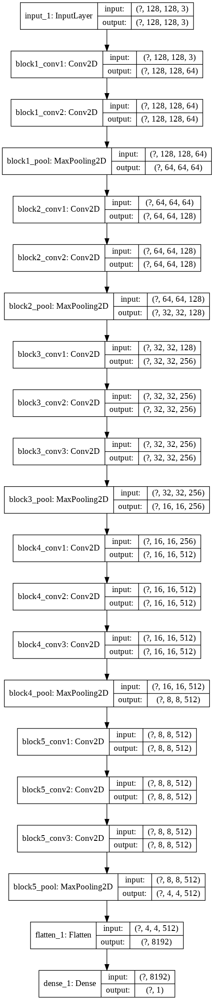

In [ ]:
from tensorflow.keras.utils import plot_model

plot_model(model_transfer, 'model_transfer.png', show_shapes=True)

In [ ]:
from keras import optimizers
model_transfer.compile(loss='binary_crossentropy',
             optimizer=optimizers.SGD(lr=0.0001, momentum=0.9),
             metrics=['accuracy'])


In [ ]:
from keras.callbacks import TensorBoard
tensorboard_callback = TensorBoard(logdir, histogram_freq=1) 
trained_model = model_transfer.fit(train_data_generator, validation_data=validation_data_generator, epochs=15,callbacks=[tensorboard_callback])

Epoch 1/15
21/92 [=====>........................] - ETA: 24:52 - loss: 0.6302 - accuracy: 0.6711

/usr/local/lib/python3.6/dist-packages/keras/utils/data_utils.py:616: UserWarning: The input 14 could not be retrieved. It could be because a worker has died.
  UserWarning)


92/92 [==============================] - 1724s 19s/step - loss: 0.5490 - accuracy: 0.7280 - val_loss: 0.1938 - val_accuracy: 0.8277
Epoch 2/15
92/92 [==============================] - 111s 1s/step - loss: 0.3921 - accuracy: 0.8369 - val_loss: 0.0352 - val_accuracy: 0.8462
Epoch 3/15
92/92 [==============================] - 111s 1s/step - loss: 0.3304 - accuracy: 0.8550 - val_loss: 0.1010 - val_accuracy: 0.8862
Epoch 4/15
92/92 [==============================] - 113s 1s/step - loss: 0.2677 - accuracy: 0.8829 - val_loss: 0.2079 - val_accuracy: 0.9231
Epoch 5/15
92/92 [==============================] - 113s 1s/step - loss: 0.2341 - accuracy: 0.8979 - val_loss: 0.2508 - val_accuracy: 0.9600
Epoch 6/15
92/92 [==============================] - 113s 1s/step - loss: 0.1909 - accuracy: 0.9258 - val_loss: 0.2578 - val_accuracy: 0.9169
Epoch 7/15
92/92 [==============================] - 112s 1s/step - loss: 0.1671 - accuracy: 0.9326 - val_loss: 0.0719 - val_accuracy: 0.9723
Epoch 8/15
92/92 [====

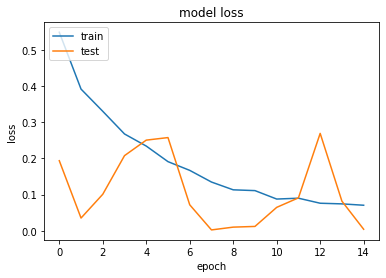

In [ ]:
plt.plot(trained_model.history['loss'])
plt.plot(trained_model.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

dict_keys(['val_loss', 'val_accuracy', 'loss', 'accuracy'])


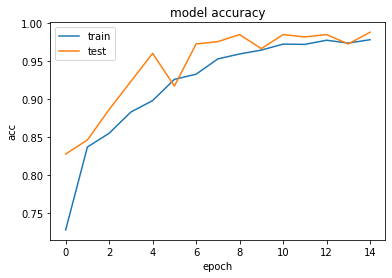

In [ ]:
import matplotlib.pyplot as plt
print(trained_model.history.keys())
plt.plot(trained_model.history['accuracy'])
plt.plot(trained_model.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('acc')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
model_transfer.save('parking_vgg16.h5')

In [ ]:
test_data_generator=validation_datagen.flow_from_dataframe(test_df, 
    "/content/drive/My Drive/Colab Notebooks/Agrobium project/Finding car parking/data/all/", 
    x_col='feature',
    y_col='category',
    target_size=(224, 224),
    class_mode='binary')

Found 210 validated image filenames belonging to 2 classes.


/usr/local/lib/python3.6/dist-packages/keras_preprocessing/image/dataframe_iterator.py:282: UserWarning: Found 4 invalid image filename(s) in x_col="feature". These filename(s) will be ignored.
  .format(n_invalid, x_col)


In [ ]:
predict_vgg=model_transfer.predict(validation_data_generator)
predict_vgg=[j for i in predict_vgg for j in i ]

In [ ]:
predict_vgg_changed=[1 if y >0.95 else 0 for y in predict_vgg]

AxesSubplot(0.125,0.125;0.62x0.755)
[[ 59  58]
 [101 107]]


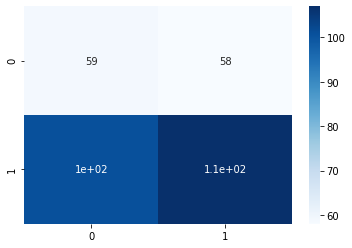

In [ ]:
import sklearn
import seaborn as sns
#y_pred = np.argmax(predict_vgg, axis=1)
cm = sklearn.metrics.confusion_matrix(validation_data_generator.classes, predict_vgg_changed)
print(sns.heatmap(cm, annot=True, cmap='Blues'))
print(cm)

In [ ]:
check_values=pd.DataFrame({'real_values':predict_vgg,'actual_labels':validation_data_generator.classes,'predicted labels':predict_vgg_changed}).sort_values(by='real_values')
check_values[(check_values[''])&()]

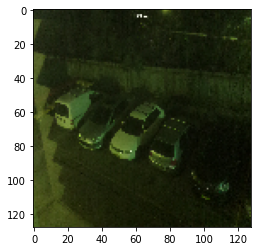

In [ ]:
from keras.preprocessing.image import ImageDataGenerator, load_img
from keras.utils import to_categorical
file_name=full_list[1000]
image1=load_img("/content/drive/My Drive/Colab Notebooks/Agrobium project/Finding car parking/data/all/"+file_name,target_size=(128, 128))

plt.figure()
plt.imshow(image1)

In [ ]:
from keras.preprocessing.image import image
from keras.applications.vgg16 import preprocess_input
x=image.img_to_array(image1)
x=np.expand_dims(x,axis=0)
data=preprocess_input(x)
class_predicted=model_transfer.predict(data)
#inID = np.argmax(class_predicted)
print(class_predicted[0])

[1.]


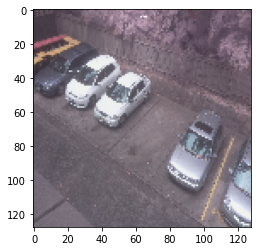

In [ ]:
from keras.preprocessing.image import ImageDataGenerator, load_img
from keras.utils import to_categorical
file_name=Free_list[1000]
image1=load_img("/content/drive/My Drive/Colab Notebooks/Agrobium project/Finding car parking/data/all/"+file_name,target_size=(128, 128))

plt.figure()
plt.imshow(image1)

In [ ]:
from keras.preprocessing.image import image
from keras.applications.vgg16 import preprocess_input

x=image.img_to_array(image1)
x=np.expand_dims(x,axis=0)
data=preprocess_input(x)
class_predicted=model_transfer.predict(data)
print(class_predicted)

[[5.9754834e-10]]


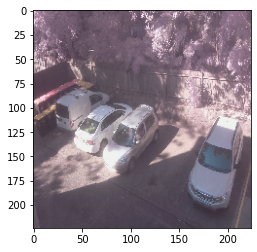

In [ ]:
from keras.preprocessing.image import ImageDataGenerator, load_img
from keras.utils import to_categorical
file_name=Free_list[2]
image1=load_img("/content/drive/My Drive/Colab Notebooks/Agrobium project/Finding car parking/data/all/"+file_name,target_size=(224, 224))

plt.figure()
plt.imshow(image1)

In [ ]:
from keras.preprocessing.image import image
from keras.applications.vgg16 import preprocess_input
x=image.img_to_array(image1)
x=np.expand_dims(x,axis=0)
data=preprocess_input(x)
model_transfer.predict(data)

array([[1.]], dtype=float32)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix


In [ ]:
# tensor-board in colab
# Refer: https://www.tensorflow.org/tensorboard/get_started
import os
import datetime

! rm -rf ./logs/ 
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
print(logdir)

logs/20200626-125839


In [ ]:

%load_ext tensorboard
%tensorboard --logdir $logdir

<IPython.core.display.Javascript object>

# Resnet50

In [ ]:
from keras.applications.resnet50 import ResNet50
from keras.models import Model
import keras
restnet = ResNet50(include_top=False, weights='imagenet', input_shape=(224, 224,3))
output = restnet.layers[-1].output
output = keras.layers.Flatten()(output)
restnet = Model(restnet.input, output=output)
for layer in restnet.layers:
    layer.trainable = False
restnet.summary()

/usr/local/lib/python3.6/dist-packages/keras_applications/resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


94658560/94653016 [==============================] - 8s 0us/step
Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 112, 112, 64) 256         conv1[0][0]                      
___________________________

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: UserWarning: Update your `Model` call to the Keras 2 API: `Model(Tensor("in..., outputs=Tensor("fl...)`
  import sys


In [ ]:
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, InputLayer
from keras.models import Sequential
from keras import optimizers
from keras.models import Model
import keras

In [ ]:

model_res = Sequential()
model_res.add(restnet)
#model_res.add(Dense(512, activation='relu', input_dim=(224, 224)))
#model_res.add(Dropout(0.3))
#model_res.add(Dense(512, activation='relu'))
#model_res.add(Dropout(0.3))
model_res.add(Dense(1, activation='sigmoid'))
model_res.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(1e-6),
              metrics=['accuracy'])
model_res.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
model_2 (Model)              (None, 100352)            23587712  
_________________________________________________________________
dense_9 (Dense)              (None, 1)                 100353    
Total params: 23,688,065
Trainable params: 100,353
Non-trainable params: 23,587,712
_________________________________________________________________


In [ ]:
history = model_res.fit(train_data_generator, validation_data=validation_data_generator, epochs=10)

Epoch 1/10
47/47 [==============================] - 87s 2s/step - loss: 1.1134 - accuracy: 0.4613 - val_loss: 0.7350 - val_accuracy: 0.4707
Epoch 2/10
47/47 [==============================] - 78s 2s/step - loss: 1.0469 - accuracy: 0.4773 - val_loss: 0.7826 - val_accuracy: 0.4707
Epoch 3/10
47/47 [==============================] - 78s 2s/step - loss: 0.9709 - accuracy: 0.5140 - val_loss: 0.7768 - val_accuracy: 0.4707
Epoch 4/10
47/47 [==============================] - 78s 2s/step - loss: 0.9398 - accuracy: 0.5234 - val_loss: 0.6938 - val_accuracy: 0.4707
Epoch 5/10
47/47 [==============================] - 79s 2s/step - loss: 0.8871 - accuracy: 0.5521 - val_loss: 0.8241 - val_accuracy: 0.4707
Epoch 6/10
47/47 [==============================] - 79s 2s/step - loss: 0.8556 - accuracy: 0.5661 - val_loss: 0.6852 - val_accuracy: 0.4707
Epoch 7/10
47/47 [==============================] - 78s 2s/step - loss: 0.8109 - accuracy: 0.5874 - val_loss: 0.5751 - val_accuracy: 0.4707
Epoch 8/10
47/47 [==